In [1]:
!nvidia-smi

Sun Dec  1 10:34:55 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   64C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
## Download the data
!git clone https://github.com/rslim087a/track.git

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163 (from 1)
Receiving objects: 100% (12163/12163), 156.98 MiB | 38.90 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
import cv2
import pandas as pd
import ntpath
import random
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa

In [6]:
data_dir = 'track'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(data_dir, 'driving_log.csv'), names = columns)
data.head()


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.615438


In [7]:
## Handling Locations
def path_leaf(path):
  head,tail=ntpath.split(path)
  return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


### Data Preprocessing

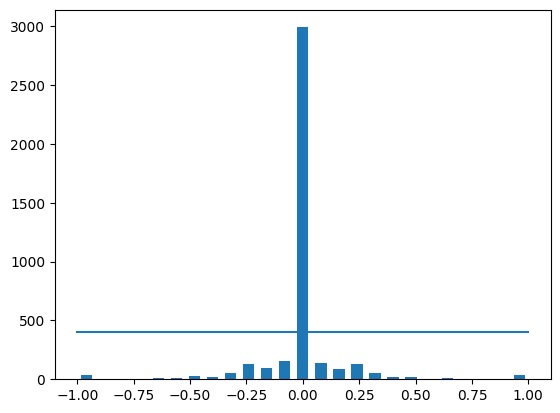

In [9]:
num_bins=25
samples_per_bin=400
hist,bins=np.histogram(data['steering'],num_bins)
center=(bins[:-1]+bins[1:])*0.5
plt.bar(center,hist,width=0.05)
plt.plot((-1,1),(samples_per_bin,samples_per_bin))

In [10]:
data.shape

(4053, 7)

In [11]:
remove_list=[]
for j in range(num_bins):
  list_=[]
  for i in range(len(data['steering'])):
    if data['steering'][i]>=bins[j] and data['steering'][i]<=bins[j+1]:
      list_.append(i)
  list_=shuffle(list_)
  list_=list_[samples_per_bin:]
  remove_list.extend(list_)

print('Removed:',len(remove_list))
data.drop(data.index[remove_list],inplace=True)
print('Remaining:',len(data))

Removed: 2590
Remaining: 1463


<BarContainer object of 25 artists>

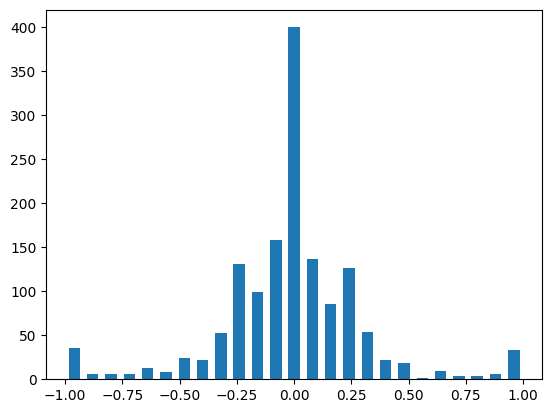

In [12]:
## let's visualize the data
hist,bins=np.histogram(data['steering'],num_bins)
center=(bins[:-1]+bins[1:])*0.5
plt.bar(center,hist,width=0.05)



In [13]:
def load_img_steering(datadir,df):
  image_path=[]
  steering=[]
  for i in range(len(data)):
    indexed_data=data.iloc[i]
    center,left,right=indexed_data[0],indexed_data[1],indexed_data[2]
    ## Center Image append()
    image_path.append(os.path.join(datadir,center.strip()))
    steering.append(float(indexed_data[3]))
  ## Left Image append()
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3]+0.15))
  ## Right Image append()
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3]-0.15))

  image_paths=np.asarray(image_path)
  steerings=np.asarray(steering)
  return image_paths,steerings

In [14]:
image_paths,steerings=load_img_steering(data_dir+'/IMG',data)

<ipython-input-13-674bc7f0010d>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center,left,right=indexed_data[0],indexed_data[1],indexed_data[2]
<ipython-input-13-674bc7f0010d>:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
<ipython-input-13-674bc7f0010d>:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]+0.15))
<ipython-input-13-674bc7f0010d>:15: Futur

In [15]:
len(image_paths)

4389

In [16]:
len(steerings)

4389

In [17]:
image_paths

array(['track/IMG/center_2018_07_16_17_11_43_382.jpg',
       'track/IMG/left_2018_07_16_17_11_43_382.jpg',
       'track/IMG/right_2018_07_16_17_11_43_382.jpg', ...,
       'track/IMG/center_2018_07_16_17_16_30_417.jpg',
       'track/IMG/left_2018_07_16_17_16_30_417.jpg',
       'track/IMG/right_2018_07_16_17_16_30_417.jpg'], dtype='<U44')

In [18]:
steerings

array([ 0.  ,  0.15, -0.15, ...,  0.  ,  0.15, -0.15])

### Train Test Split

In [19]:
## Train Test Split
X_train,X_valid,y_train,y_valid=train_test_split(image_paths,steerings,test_size=0.2,random_state=6)
print('Train Size:',len(X_train))
print('Valid Size:',len(X_valid))

Train Size: 3511
Valid Size: 878


Text(0.5, 1.0, 'Validation Set')

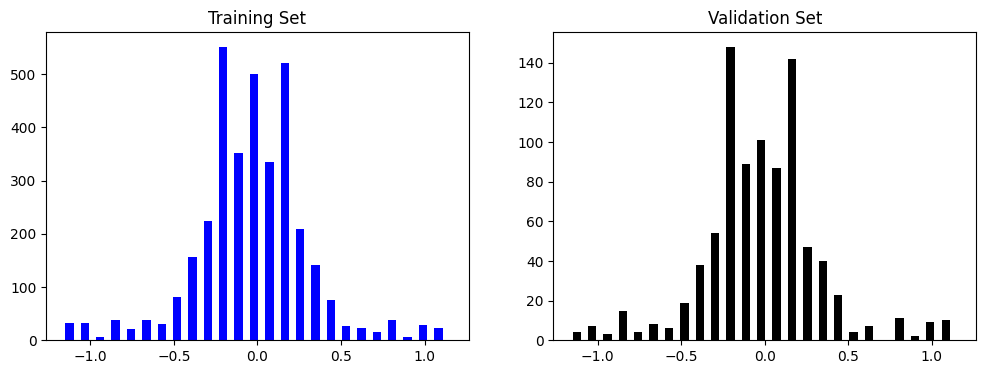

In [21]:
fig,axes=plt.subplots(1,2,figsize=(12,4))
axes[0].hist(y_train,bins=num_bins,width=0.05,color='blue')
axes[0].set_title('Training Set')
axes[1].hist(y_valid,bins=num_bins,width=0.05,color='black')
axes[1].set_title('Validation Set')

## Data Augmentation

Text(0.5, 1.0, 'Zoomed Image')

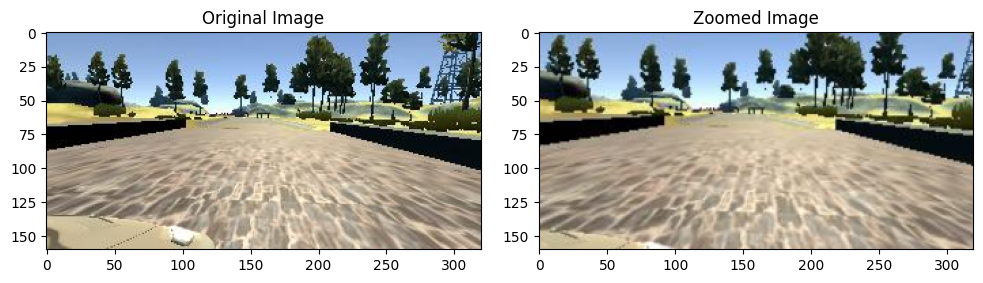

In [22]:
def zoom(image):
  zoom=iaa.Affine(scale=(1,1.3))
  image=zoom.augment_image(image)
  return image

image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
zoomed_image=zoom(original_image)

fig,axes=plt.subplots(1,2,figsize=(10,4))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(zoomed_image)
axes[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

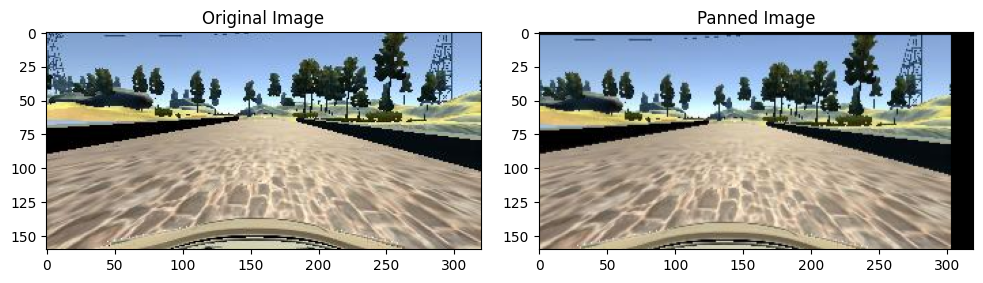

In [24]:
def pan(image):
  pan=iaa.Affine(translate_percent={'x':(-0.1,0.1),'y':(-0.1,0.1)})
  image=pan.augment_image(image)
  return image

image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
panned_image=pan(original_image)

fig,axes=plt.subplots(1,2,figsize=(10,4))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(panned_image)
axes[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness Image')

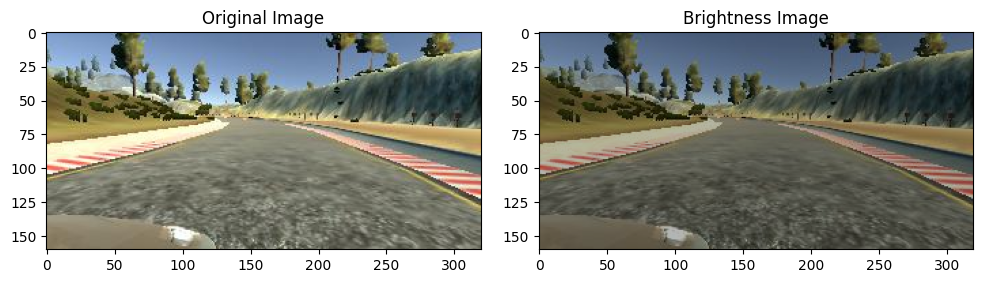

In [25]:
def img_random_brightness(image):
  brightness=iaa.Multiply((0.2,1.2))
  image=brightness.augment_image(image)
  return image

image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
brightness_image=img_random_brightness(original_image)

fig,axes=plt.subplots(1,2,figsize=(10,4))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(brightness_image)
axes[1].set_title('Brightness Image')

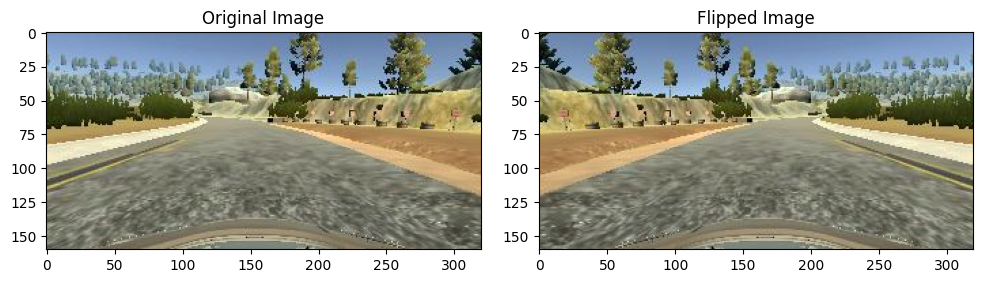

Original Steering Angle:  -0.200166
Flipped Steering Angle:  0.200166


In [26]:
def img_random_flip(image,steering_angle):
  image=cv2.flip(image,1)
  steering_angle=-steering_angle
  return image,steering_angle

random_index=random.randint(0,1000)
image=image_paths[random_index]
steering_angle=steerings[random_index]

original_image=mpimg.imread(image)
flipped_image,flipped_steering_angle=img_random_flip(original_image,steering_angle)

fig,axes=plt.subplots(1,2,figsize=(10,4))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(flipped_image)
axes[1].set_title('Flipped Image')
plt.show()
print('Original Steering Angle: ',steering_angle)
print('Flipped Steering Angle: ',flipped_steering_angle)

In [27]:
def random_augment(image,steering_angle):
  image=mpimg.imread(image)
  if np.random.rand()<0.5:
    image=pan(image)
  if np.random.rand()<0.5:
    image=zoom(image)
  if np.random.rand()<0.5:
    image=img_random_brightness(image)
  if np.random.rand()<0.5:
    image,steering_angle=img_random_flip(image,steering_angle)
  return image,steering_angle


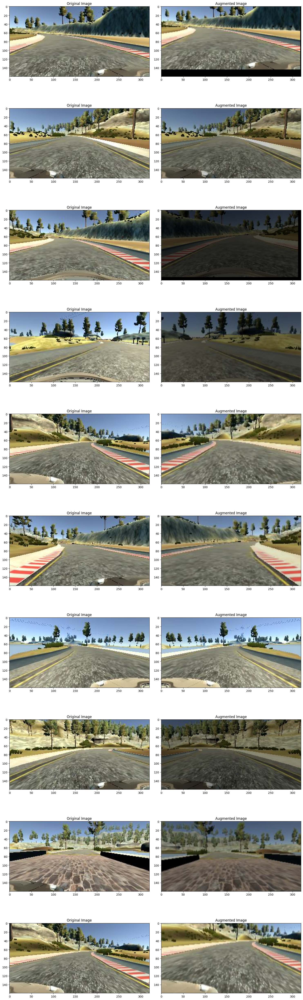

In [29]:
ncol=2
nrow=10


fig, axs = plt.subplots(nrow,ncol,figsize=(15,50))
fig.tight_layout()

for i in range(10):
  rand_num=random.randint(0,len(image_paths)-1)
  random_image=image_paths[rand_num]
  random_steering=steerings[rand_num]

  original_image=mpimg.imread(random_image)
  augmented_image,augmented_steering=random_augment(random_image,random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title('Original Image')
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title('Augmented Image')


In [32]:
def img_preprocessing(img):
  img=img[60:135,:,:]
  # Corrected the typo here: Removed the extra 'cv2,'
  img=cv2.cvtColor(img,cv2.COLOR_RGB2YUV)
  img=cv2.GaussianBlur(img,(3,3),0)
  img=cv2.resize(img,(200,66))
  img=img/255
  return img

Text(0.5, 1.0, 'Preprocessed Image')

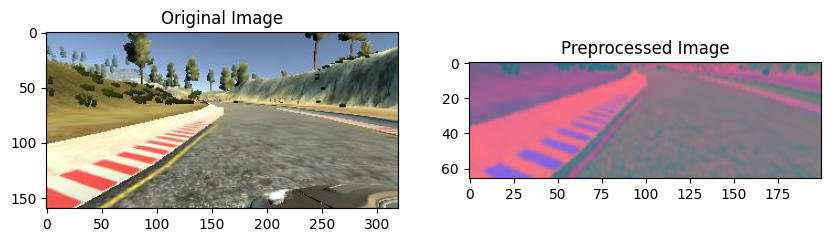

In [33]:
image = image_paths[100]
original_image=mpimg.imread(image)
preprocessed_image=img_preprocessing(original_image)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')

In [34]:
def batch_generator(image_paths,steerings,batch_size,is_training):
  while True:
    batch_img=[]
    batch_steering=[]
    for i in range(batch_size):
      random_index=random.randint(0,len(image_paths)-1)
      if is_training==True:
        im,steering=random_augment(image_paths[random_index],steerings[random_index])
      else:
        im=mpimg.imread(image_paths[random_index])
        steering=steerings[random_index]
      im=img_preprocessing(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield np.asarray(batch_img),np.asarray(batch_steering)

In [35]:
x_train_gen,y_train_gen=next(batch_generator(X_train,y_train,1,1))
x_valid_gen,y_valid_gen=next(batch_generator(X_valid,y_valid,1,0))

Text(0.5, 1.0, 'Validation Image')

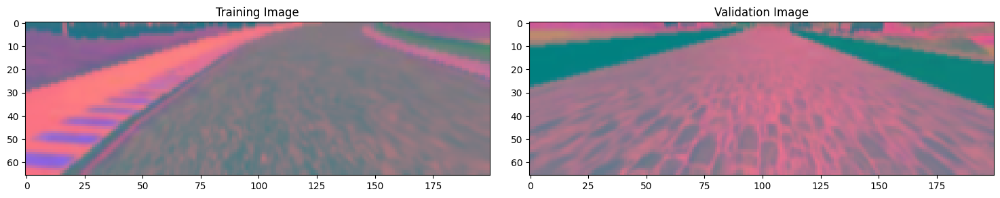

In [36]:
fig, axs = plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [37]:
x_train_gen.shape

(1, 66, 200, 3)

In [38]:
x_valid_gen.shape

(1, 66, 200, 3)

In [40]:
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,Dropout,Flatten,Dense

In [43]:
def nvidia_model():
  model=Sequential()
  model.add(keras.layers.Conv2D(24,(5,5),strides=(2,2),input_shape=(66,200,3),activation='elu'))
  model.add(keras.layers.Conv2D(36,(5,5),strides=(2,2),activation='elu'))
  model.add(keras.layers.Conv2D(48,(5,5),strides=(2,2),activation='elu'))
  model.add(keras.layers.Conv2D(64,(3,3),activation='elu'))
  model.add(Flatten())
  model.add(Dense(100,activation='elu'))
  model.add(Dense(50,activation='elu'))
  model.add(Dense(10,activation='elu'))
  model.add(Dense(1))
  # Replacing 'lr' with 'learning_rate' in Adam optimizer
  optimizer=keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse',optimizer=optimizer)
  return model

In [44]:
model=nvidia_model()
print(model.summary())

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 31, 98, 24)          │           1,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 14, 47, 36)          │          21,636 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 5, 22, 48)           │          43,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 3, 20, 64)           │          27,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 3840)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 100)                 │         384,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 10)                  │             510 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 484,091 (1.85 MB)

 Trainable params: 484,091 (1.85 MB)

 Non-trainable params: 0 (0.00 B)

None


In [47]:
history=model.fit(batch_generator(X_train,y_train,100,1),
                  steps_per_epoch=300,
                  epochs=10,
                  validation_data=batch_generator(X_valid,y_valid,100,0),
                  validation_steps=200,verbose=1,shuffle=1)


Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 130s 410ms/step - loss: 0.2048 - val_loss: 0.0774
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 129s 432ms/step - loss: 0.0742 - val_loss: 0.0573
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 119s 397ms/step - loss: 0.0600 - val_loss: 0.0417
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 118s 394ms/step - loss: 0.0518 - val_loss: 0.0369
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 119s 399ms/step - loss: 0.0467 - val_loss: 0.0305
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 122s 407ms/step - loss: 0.0440 - val_loss: 0.0287
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 113s 377ms/step - loss: 0.0418 - val_loss: 0.0274
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 112s 374ms/step - loss: 0.0389 - val_loss: 0.0264
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 112s 375ms/step - loss: 0.0373 - val_loss: 0.0243
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 113s 377ms/step - loss: 0.0359 - val_loss: 0.0258


Text(0.5, 0, 'Epoch')

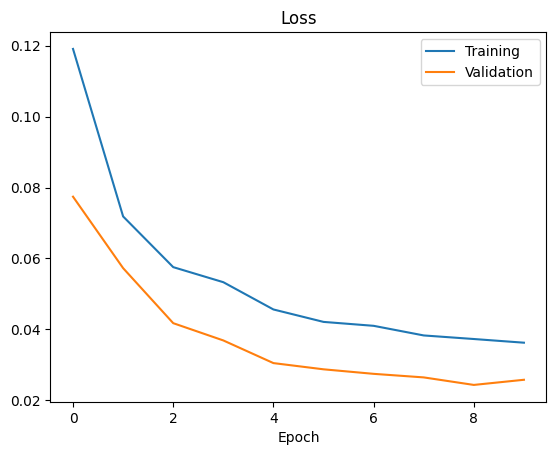

In [48]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Training','Validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [49]:
model.save('model.h5')